# EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_pickle("cleansing_df.pkl")
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4033120 entries, 0 to 34636377
Data columns (total 27 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Unnamed: 0  int64  
 1   ssn         object 
 2   cc_num      int64  
 3   first       object 
 4   last        object 
 5   gender      object 
 6   street      object 
 7   city        object 
 8   state       object 
 9   zip         int64  
 10  lat         float64
 11  long        float64
 12  city_pop    int64  
 13  job         object 
 14  dob         object 
 15  acct_num    int64  
 16  profile     object 
 17  trans_num   object 
 18  trans_date  object 
 19  trans_time  object 
 20  unix_time   int64  
 21  category    object 
 22  amt         float64
 23  is_fraud    int64  
 24  merchant    object 
 25  merch_lat   float64
 26  merch_long  float64
dtypes: float64(5), int64(7), object(15)
memory usage: 861.6+ MB


--- Starting Exploratory Data Analysis (EDA) ---
Using 'is_fraud' as the target variable for fraud detection.

--- Instant Reports: Quick Overview ---

Shape of the DataFrame: (4033120, 27)

Columns and their data types:
<class 'pandas.core.frame.DataFrame'>
Index: 4033120 entries, 0 to 34636377
Data columns (total 27 columns):
 #   Column      Dtype  
---  ------      -----  
 0   Unnamed: 0  int64  
 1   ssn         object 
 2   cc_num      int64  
 3   first       object 
 4   last        object 
 5   gender      object 
 6   street      object 
 7   city        object 
 8   state       object 
 9   zip         int64  
 10  lat         float64
 11  long        float64
 12  city_pop    int64  
 13  job         object 
 14  dob         object 
 15  acct_num    int64  
 16  profile     object 
 17  trans_num   object 
 18  trans_date  object 
 19  trans_time  object 
 20  unix_time   int64  
 21  category    object 
 22  amt         float64
 23  is_fraud    int64  
 24  merchant    obj

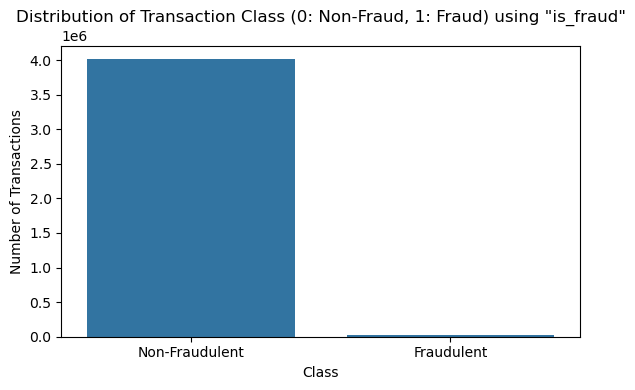

Skipping distribution plot for 'Time' as it was not found.
Skipping distribution plot for 'Amount' as it was not found.
Skipping box plot for 'Amount' by 'is_fraud' as 'Amount' was not found.

--- Visualizing Distributions of V-Features by Class ---
No V-features (e.g., V1, V2) found in the dataset. Skipping V-feature distribution plots.

--- Correlation Analysis ---


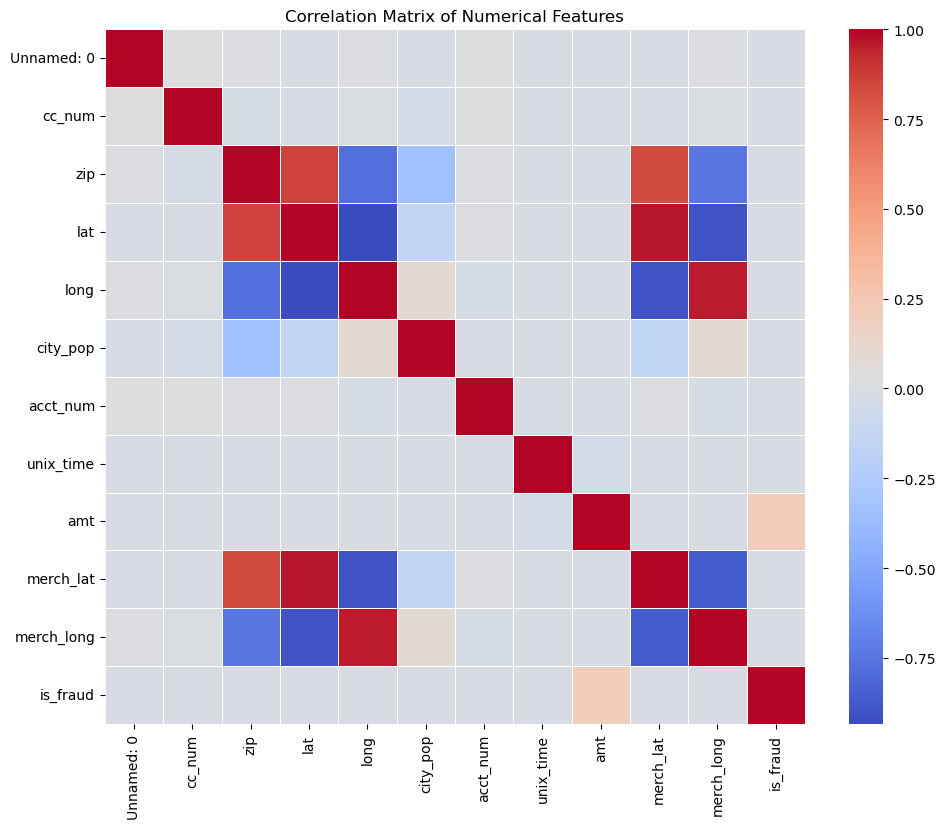


--- Feature Correlation with Target ('is_fraud') ---
is_fraud      1.000000
amt           0.208843
city_pop      0.002008
Unnamed: 0    0.001421
cc_num        0.001364
lat           0.000463
merch_lat     0.000303
acct_num      0.000288
zip          -0.000356
long         -0.000379
merch_long   -0.000491
unix_time    -0.007812
Name: is_fraud, dtype: float64


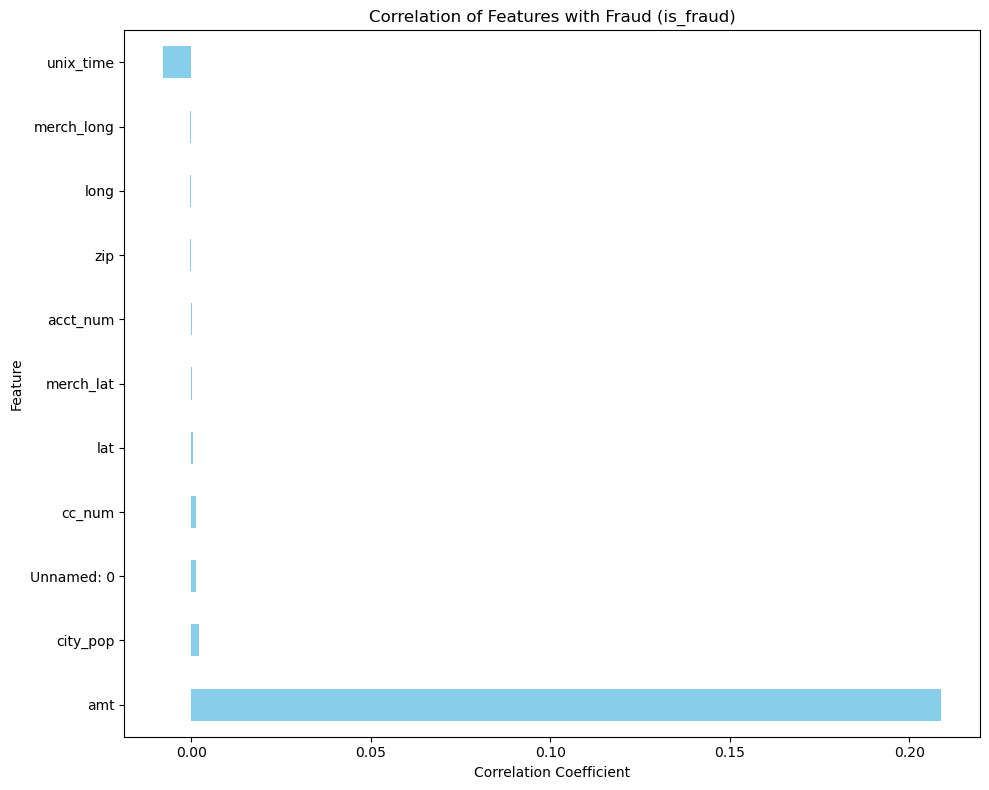


--- Identifying Potential Multicollinearity ---
Found highly correlated feature pairs (absolute correlation > 0.8, excluding target):
  zip - lat: 0.8595
  zip - merch_lat: 0.8273
  lat - long: -0.9347
  lat - merch_lat: 0.9626
  lat - merch_long: -0.8970
  long - merch_lat: -0.8998
  long - merch_long: 0.9597
  merch_lat - merch_long: -0.8635

--- EDA Complete ---


In [2]:
print("--- Starting Exploratory Data Analysis (EDA) ---")

# --- Determine the target variable name ---
TARGET_COLUMN = None
if 'Class' in df.columns:
    TARGET_COLUMN = 'Class'
elif 'is_fraud' in df.columns: # Common name in the 'Mega Dataset' transactions.csv
    TARGET_COLUMN = 'is_fraud'
else:
    print("ERROR: Could not find a suitable target variable column ('Class' or 'is_fraud').")
    print("Please check your DataFrame columns. Available columns are:", df.columns.tolist())
    exit() # Exit the script if the target column is not found

print(f"Using '{TARGET_COLUMN}' as the target variable for fraud detection.")

# --- Identify other key numerical columns ---
TIME_COLUMN = 'Time'
AMOUNT_COLUMN = 'Amount'

has_time_column = TIME_COLUMN in df.columns
has_amount_column = AMOUNT_COLUMN in df.columns

if not has_time_column:
    print(f"WARNING: '{TIME_COLUMN}' column not found. Skipping plots and analysis involving 'Time'.")
if not has_amount_column:
    print(f"WARNING: '{AMOUNT_COLUMN}' column not found. Skipping plots and analysis involving 'Amount'.")


# --- 2. Exploratory Data Analysis (EDA) ---

# --- Instant Reports: Quick Overview ---
print("\n--- Instant Reports: Quick Overview ---")

print("\nShape of the DataFrame:", df.shape)
print("\nColumns and their data types:")
df.info()
print("\nDescriptive statistics for numerical columns:")
print(df.describe())

# Check for missing values (again, just to be sure)
print("\nMissing values per column:")
print(df.isnull().sum()[df.isnull().sum() > 0]) # Only show columns with missing values

# Check class distribution - CRUCIAL for fraud detection
print(f"\nTarget variable ({TARGET_COLUMN}) distribution:")
print(df[TARGET_COLUMN].value_counts())
print(f"Percentage of fraudulent transactions: {df[TARGET_COLUMN].value_counts(normalize=True)[1]*100:.4f}%")

# --- Descriptive Analysis: Visualizations and Statistical Methods ---
print("\n--- Descriptive Analysis: Visualizations ---")

# Visualize the Class distribution
plt.figure(figsize=(6, 4))
sns.countplot(x=TARGET_COLUMN, data=df)
plt.title(f'Distribution of Transaction Class (0: Non-Fraud, 1: Fraud) using "{TARGET_COLUMN}"')
plt.xlabel('Class')
plt.ylabel('Number of Transactions')
plt.xticks(ticks=[0, 1], labels=['Non-Fraudulent', 'Fraudulent'])
plt.tight_layout()
plt.show()

# Distribution of 'Time' feature (if present)
if has_time_column:
    plt.figure(figsize=(12, 5))
    sns.histplot(df[TIME_COLUMN], bins=50, kde=True, color='blue')
    plt.title(f'Distribution of Transaction {TIME_COLUMN}')
    plt.xlabel(f'{TIME_COLUMN} (seconds since first transaction)' if TIME_COLUMN == 'Time' else TIME_COLUMN)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()
else:
    print(f"Skipping distribution plot for '{TIME_COLUMN}' as it was not found.")


# Distribution of 'Amount' feature (if present)
if has_amount_column:
    plt.figure(figsize=(12, 5))
    sns.histplot(df[AMOUNT_COLUMN], bins=50, kde=True, color='green')
    plt.title(f'Distribution of Transaction {AMOUNT_COLUMN}')
    plt.xlabel(AMOUNT_COLUMN)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()
else:
    print(f"Skipping distribution plot for '{AMOUNT_COLUMN}' as it was not found.")


# Box plot of Amount by Class (shows if fraudulent amounts are different) (if Amount is present)
if has_amount_column:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=TARGET_COLUMN, y=AMOUNT_COLUMN, data=df, palette='viridis')
    plt.title(f'Transaction {AMOUNT_COLUMN} by Class using "{TARGET_COLUMN}"')
    plt.xlabel('Class (0: Non-Fraud, 1: Fraud)')
    plt.ylabel(AMOUNT_COLUMN)
    # plt.ylim(0, 2000) # Optional: Limit y-axis for better visualization due to outliers, remove if you want full range
    plt.xticks(ticks=[0, 1], labels=['Non-Fraudulent', 'Fraudulent'])
    plt.tight_layout()
    plt.show()
else:
    print(f"Skipping box plot for '{AMOUNT_COLUMN}' by '{TARGET_COLUMN}' as '{AMOUNT_COLUMN}' was not found.")


# --- Visualizing distributions of selected V-features for both classes ---
print("\n--- Visualizing Distributions of V-Features by Class ---")
# Dynamically find existing V-features
all_columns = df.columns.tolist()
existing_v_features = [col for col in all_columns if col.startswith('V') and col[1:].isdigit() and len(col) > 1] # e.g., V1, V2, ..., V28

# Let's try to select some common V-features if they exist, otherwise use all found.
# If you expect specific V-features, adjust this logic.
v_features_to_plot = []
if existing_v_features:
    # Try to plot up to 12 V-features to keep the plot manageable, selecting common ones
    common_v_features = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28']
    for v_feat in common_v_features:
        if v_feat in existing_v_features and len(v_features_to_plot) < 12: # Plot up to 12
            v_features_to_plot.append(v_feat)
    if not v_features_to_plot: # If none of the common ones were found, just take the first few existing
         v_features_to_plot = existing_v_features[:12]
    print(f"Plotting the following V-features: {v_features_to_plot}")

    if v_features_to_plot:
        num_plots = len(v_features_to_plot)
        rows = (num_plots + 3) // 4 # Calculate rows needed for 4 columns
        plt.figure(figsize=(16, rows * 4)) # Adjust figure size dynamically
        for i, feature in enumerate(v_features_to_plot):
            plt.subplot(rows, 4, i + 1)
            sns.histplot(df[df[TARGET_COLUMN] == 0][feature], bins=50, kde=True, color='blue', label='Non-Fraud', stat='density', alpha=0.6)
            sns.histplot(df[df[TARGET_COLUMN] == 1][feature], bins=50, kde=True, color='red', label='Fraud', stat='density', alpha=0.6)
            plt.title(f'Distribution of {feature} by Class')
            plt.xlabel(feature)
            plt.ylabel('Density')
            plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print("No V-features found to plot.")
else:
    print("No V-features (e.g., V1, V2) found in the dataset. Skipping V-feature distribution plots.")


# --- Correlation and other relationship Analysis ---
print("\n--- Correlation Analysis ---")

# Calculate the correlation matrix, only for numerical columns
# Ensure we only include numerical columns for correlation calculation
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
if TARGET_COLUMN in numerical_cols:
    numerical_cols.remove(TARGET_COLUMN) # Temporarily remove target for pure feature correlation
numerical_cols.append(TARGET_COLUMN) # Add target back at the end for full correlation with target

if len(numerical_cols) < 2: # Need at least 2 numerical columns for correlation
    print("Not enough numerical columns to compute a meaningful correlation matrix.")
    correlation_matrix = pd.DataFrame() # Empty dataframe
else:
    correlation_matrix = df[numerical_cols].corr()
    # Visualize the correlation matrix (heatmap)
    plt.figure(figsize=(max(10, len(numerical_cols)*0.7), max(8, len(numerical_cols)*0.7)))
    sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f", linewidths=.5) # annot=False due to many features
    plt.title('Correlation Matrix of Numerical Features')
    plt.tight_layout()
    plt.show()


# --- Correlation with the Target Variable ---
if TARGET_COLUMN in correlation_matrix.columns: # Check if target is in the correlation matrix
    print(f"\n--- Feature Correlation with Target ('{TARGET_COLUMN}') ---")
    # Get correlations with the target variable, sort them
    correlation_with_target = correlation_matrix[TARGET_COLUMN].sort_values(ascending=False)
    print(correlation_with_target)

    # Visualize correlation with target
    plt.figure(figsize=(10, 8))
    # Drop the target column itself from the plot to avoid a 1.0 correlation with itself
    correlation_with_target.drop(TARGET_COLUMN, errors='ignore').plot(kind='barh', color='skyblue')
    plt.title(f'Correlation of Features with Fraud ({TARGET_COLUMN})')
    plt.xlabel('Correlation Coefficient')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()
else:
    print(f"Skipping correlation with target as '{TARGET_COLUMN}' was not found in the correlation matrix.")


# --- Identifying Multicollinearity (Optional, for advanced insights) ---
if not correlation_matrix.empty and len(numerical_cols) > 2: # Need at least 3 numerical cols to check pairs meaningfully
    print("\n--- Identifying Potential Multicollinearity ---")
    high_corr_threshold = 0.8 # Define what you consider high correlation

    # Find highly correlated pairs (excluding correlation with the target itself for this check)
    features_for_multicollinearity = [col for col in numerical_cols if col != TARGET_COLUMN]
    high_corr_pairs = []
    for i in range(len(features_for_multicollinearity)):
        for j in range(i + 1, len(features_for_multicollinearity)):
            col1 = features_for_multicollinearity[i]
            col2 = features_for_multicollinearity[j]
            corr_value = correlation_matrix.loc[col1, col2]
            if abs(corr_value) > high_corr_threshold:
                high_corr_pairs.append((col1, col2, corr_value))

    if high_corr_pairs:
        print(f"Found highly correlated feature pairs (absolute correlation > {high_corr_threshold}, excluding target):")
        for pair in high_corr_pairs:
            print(f"  {pair[0]} - {pair[1]}: {pair[2]:.4f}")
    else:
        print(f"No highly correlated feature pairs found (absolute correlation > {high_corr_threshold}, excluding target).")
else:
    print("Skipping multicollinearity check due to insufficient numerical features or empty correlation matrix.")


print("\n--- EDA Complete ---")

In [3]:
!pip install autoviz 
!pip install nltk

--- Original DataFrame Info ---
Shape of original data: (4033120, 27)
Original columns: ['Unnamed: 0', 'ssn', 'cc_num', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat', 'long', 'city_pop', 'job', 'dob', 'acct_num', 'profile', 'trans_num', 'trans_date', 'trans_time', 'unix_time', 'category', 'amt', 'is_fraud', 'merchant', 'merch_lat', 'merch_long']

--- Running AutoViz on the CLEANED Data ---
    Since nrows is smaller than dataset, loading random sample of 150000 rows into pandas...
Shape of your Data Set loaded: (150000, 27)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  5
    Number of Integer-Categorical Columns =  5
    Number of String-Categorical Columns =  3
    Number of Factor

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
ssn,object,0.000000,1,,,No issue
cc_num,int64,0.000000,1,60405657234.000000,4997233757542281216.000000,Column has 10911 outliers greater than upper bound (11091061075907640.00) or lower than lower bound(-6605693997221987.00). Cap them or remove them.
first,object,0.000000,0,,,Possible high cardinality column with 483 unique values: Use hash encoding or text embedding to reduce dimension.
last,object,0.000000,0,,,Possible high cardinality column with 708 unique values: Use hash encoding or text embedding to reduce dimension.
gender,object,0.000000,0,,,No issue
street,object,0.000000,1,,,No issue
city,object,0.000000,0,,,Possible high cardinality column with 487 unique values: Use hash encoding or text embedding to reduce dimension.
zip,int64,0.000000,0,90002.000000,96150.000000,"Column has a high correlation with ['lat', 'merch_lat']. Consider dropping one of them."
lat,float64,0.000000,NA,32.562600,41.781700,No issue
long,float64,0.000000,NA,-124.251400,-115.377500,Column has a high correlation with ['lat']. Consider dropping one of them.


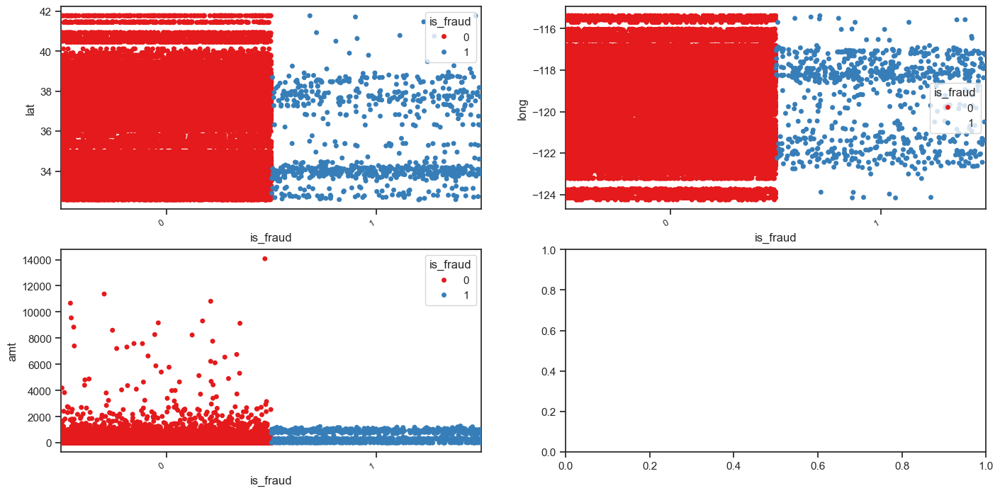

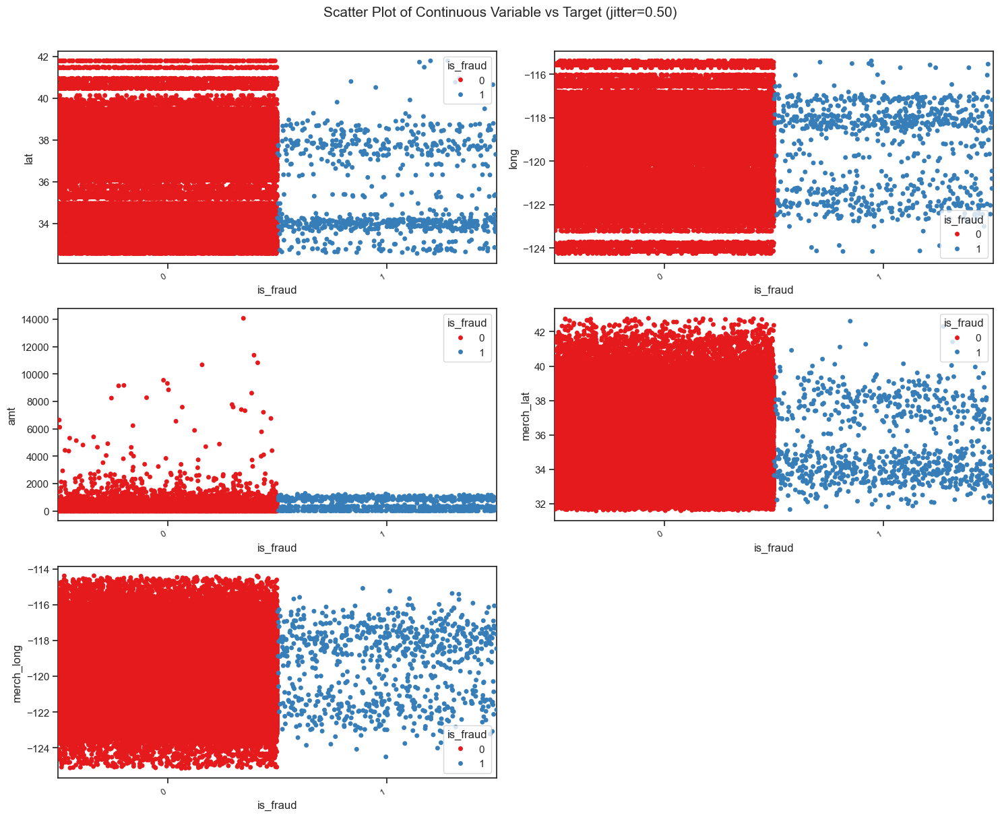

Total Number of Scatter Plots = 15


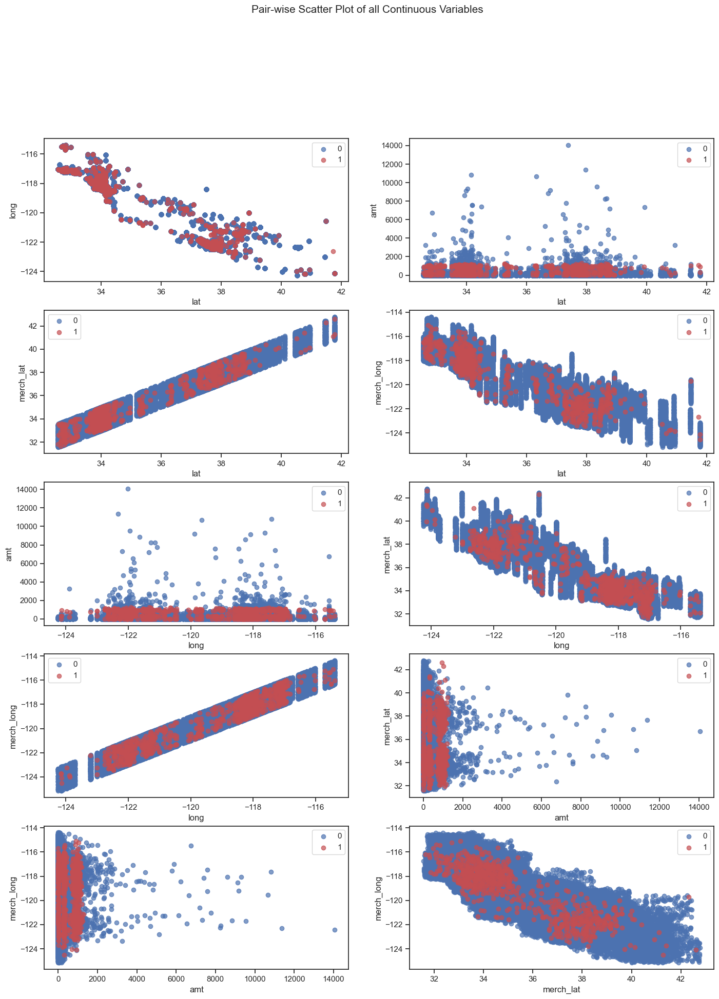

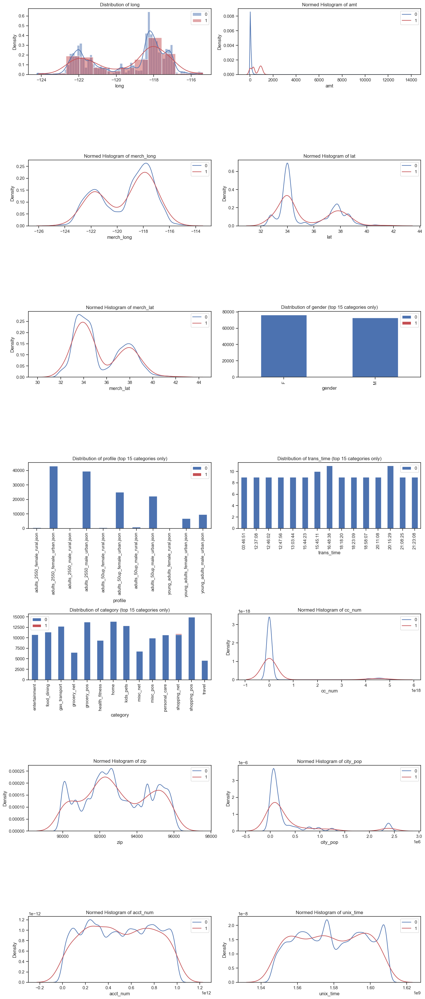

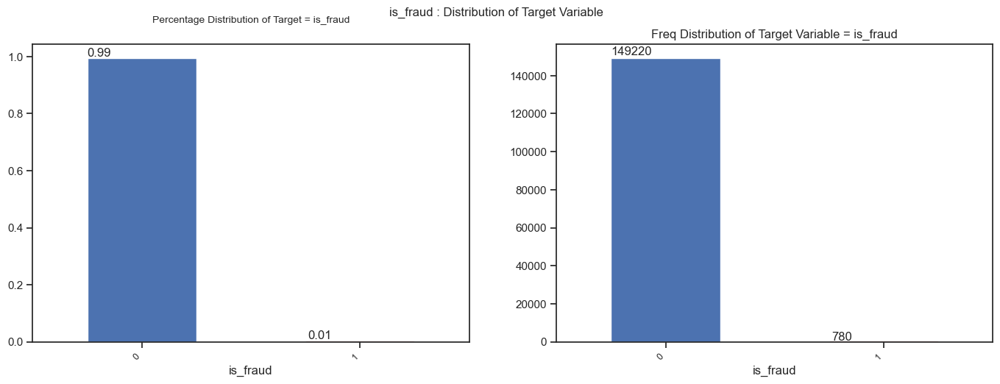

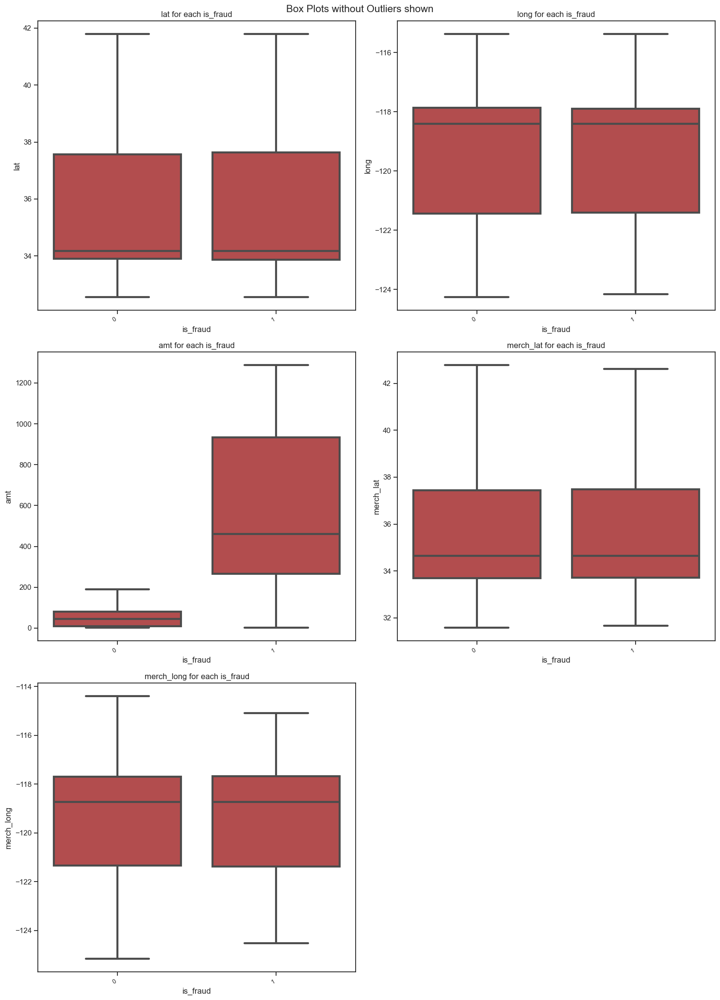

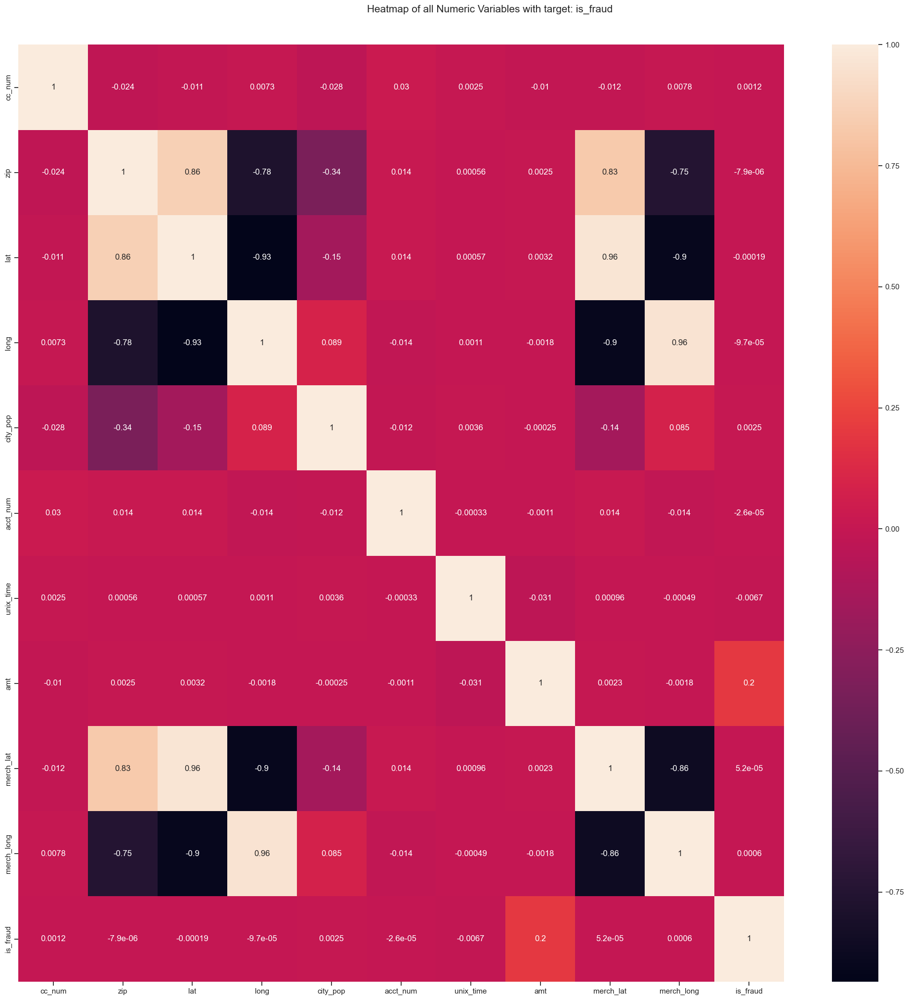

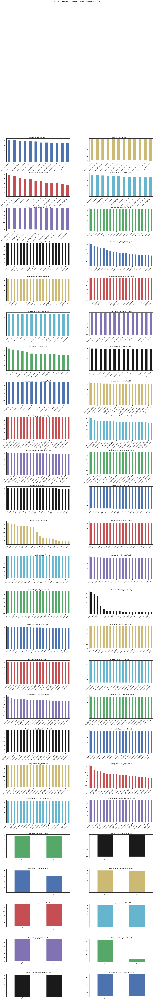

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\oridr\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\oridr\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\oridr\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\oridr\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\oridr\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]   

Could not draw wordcloud plot for ssn. We need at least 1 word to plot a word cloud, got 0.


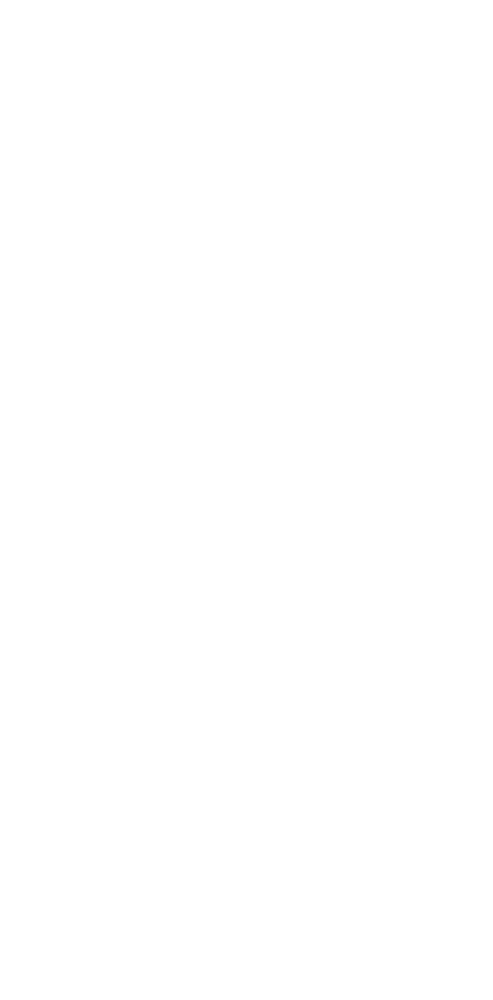

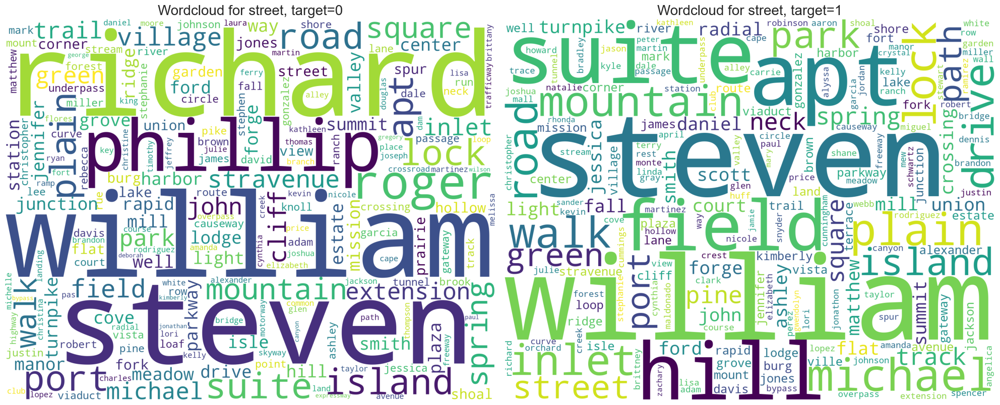

Could not draw wordcloud plot for dob. We need at least 1 word to plot a word cloud, got 0.


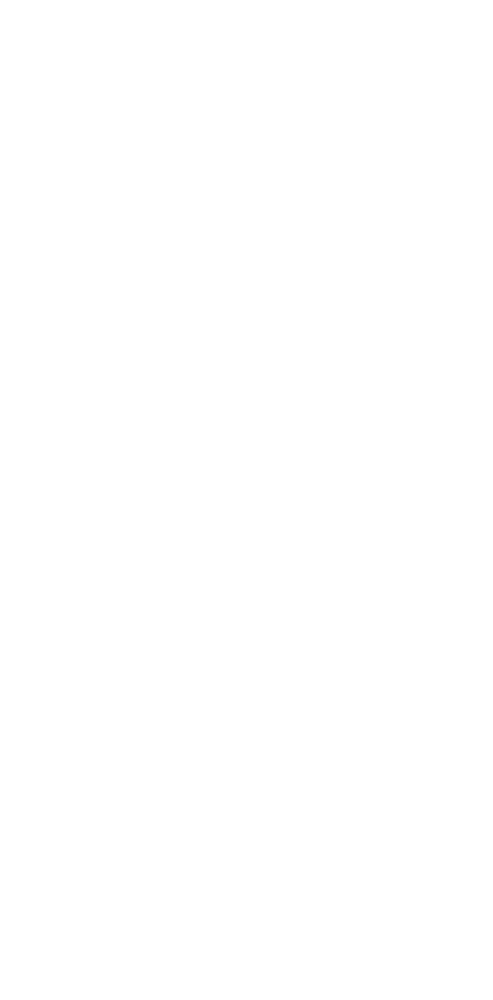

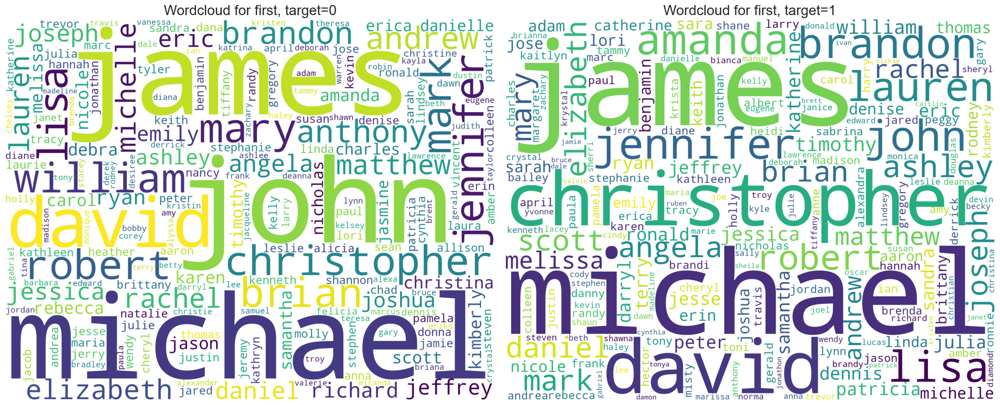

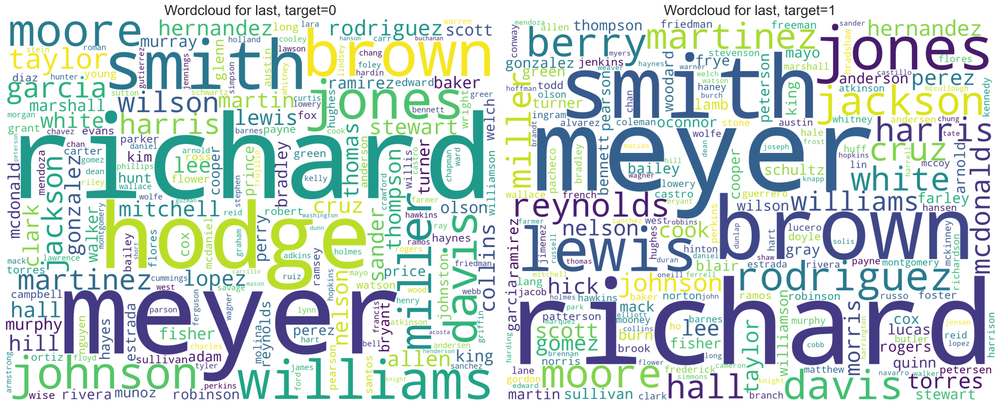

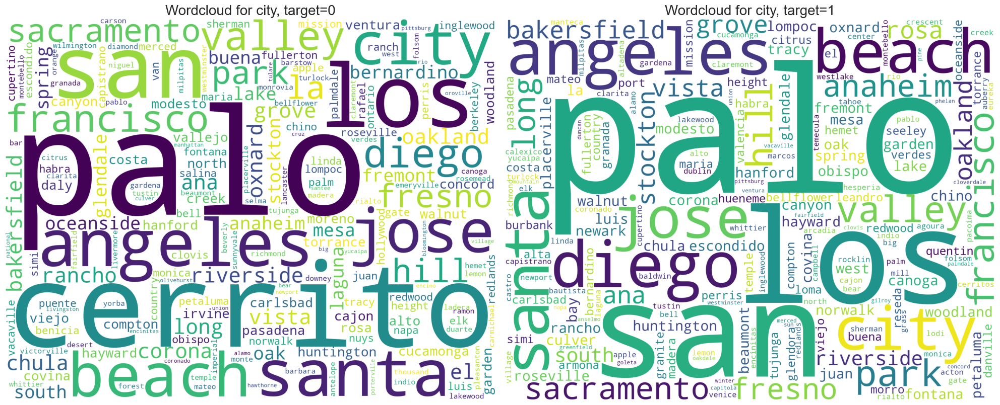

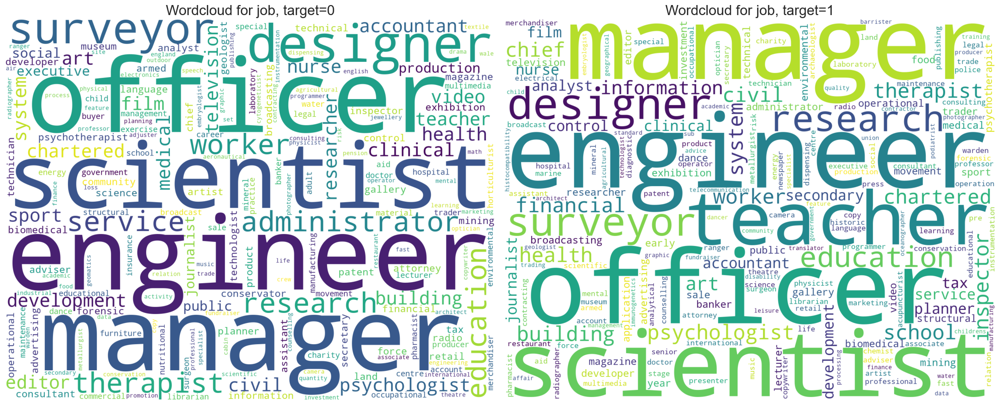

Could not draw wordcloud plot for trans_date. We need at least 1 word to plot a word cloud, got 0.


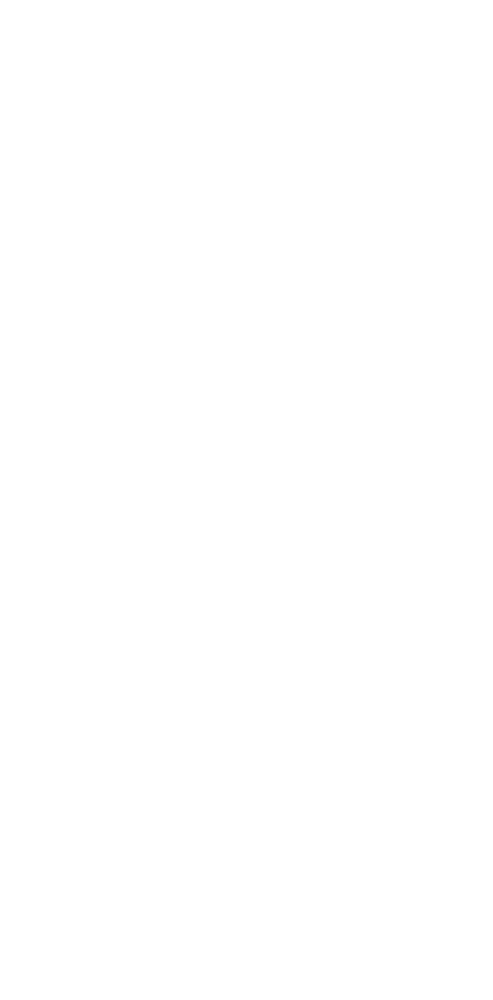

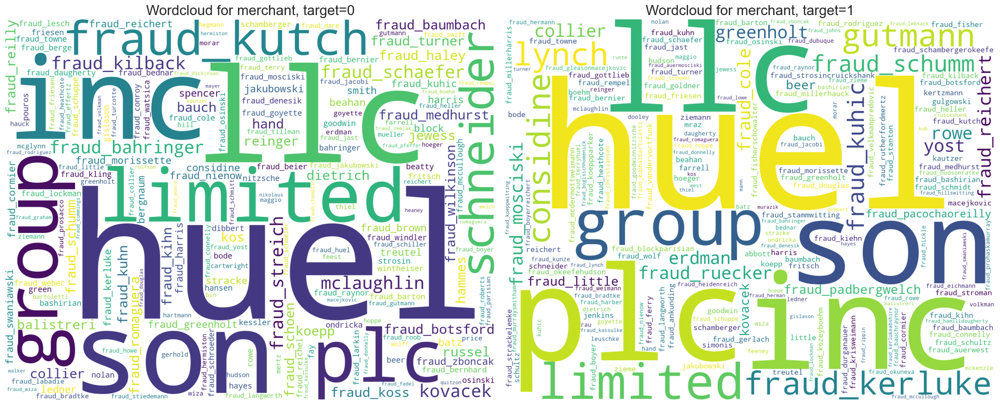

All Plots done
Time to run AutoViz = 350 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [9]:
%matplotlib inline

import pandas as pd
from autoviz import FixDQ
from autoviz.AutoViz_Class import AutoViz_Class


# 1. Load your original, unclean DataFrame
df = pd.read_pickle("cleansing_df.pkl")
print("--- Original DataFrame Info ---")
print(f"Shape of original data: {df.shape}")
print("Original columns:", df.columns.tolist())

# 2. Use FixDQ to automatically clean the data
#    Instantiate the FixDQ class
#fixdq = FixDQ()

#    Use the fit_transform() method to apply the fixes
#    This will handle outliers, drop ID columns, etc., automatically.
#df_fixed = fixdq.fit_transform(df)

#print("\n--- Cleaned DataFrame Info ---")
#print(f"Shape of cleaned data: {df_fixed.shape}")
#print("Cleaned columns:", df_fixed.columns.tolist())
#print("\nNotice that ID columns like 'Unnamed: 0' and 'trans_num' have been dropped.")
#print("The data types may also have been optimized.")

# 3. (RECOMMENDED) Re-run AutoViz on the NEW, CLEANED DataFrame
#    This will confirm the data quality issues are gone and give you cleaner plots.
AV = AutoViz_Class()

print("\n--- Running AutoViz on the CLEANED Data ---")
dft = AV.AutoViz(
    filename="",
    dfte=df,
    depVar='is_fraud', # Still focusing on the target variable
    verbose=1,
    max_rows_analyzed=150000 
)